## 1. Mount Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 2. Install Ultralytics

In [ ]:
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 38.7 MB/s eta 0:00:00


## 3. Imports & config

In [ ]:
import json
import shutil
import random
from pathlib import Path
import os
import glob
from IPython.display import display, Image as IPImage
from ultralytics import YOLO
import cv2

In [ ]:
SRC_FOLDER = Path("/content/drive/MyDrive/png")
DST_FOLDER = Path("/content/yolo_dataset")
VAL_RATIO = 0.2
SEED = 42

LABEL_MAP = {"1": 0, "2": 1}
CLASS_NAMES = {0: "HF", 1: "LF"}

## 4. Define conversion function

In [ ]:
def convert_annotation(json_path: Path, out_label_path: Path):
    with open(json_path) as f:
        data = json.load(f)

    img_w = data["imageWidth"]
    img_h = data["imageHeight"]

    lines = []
    for shape in data["shapes"]:
        if shape["shape_type"] != "oriented_rectangle":
            print(f"  ⚠ Skipping non-oriented_rectangle in {json_path.name}")
            continue

        label = shape["label"]
        if label not in LABEL_MAP:
            print(f"  ⚠ Unknown label '{label}' in {json_path.name}, skipping")
            continue

        cls_idx = LABEL_MAP[label]
        points = shape["points"]

        if len(points) != 4:
            print(f"  ⚠ Expected 4 points, got {len(points)} in {json_path.name}")
            continue

        # Normalize coordinates to [0, 1]
        norm_points = []
        for x, y in points:
            norm_points.append(x / img_w)
            norm_points.append(y / img_h)

        coords_str = " ".join(f"{v:.6f}" for v in norm_points)
        lines.append(f"{cls_idx} {coords_str}")

    with open(out_label_path, "w") as f:
        f.write("\n".join(lines))

    return len(lines)

## 5. Find image-annotation pairs, split & convert

In [ ]:
# Find all json+image pairs
pairs = []
for json_file in sorted(SRC_FOLDER.glob("*.json")):
    img_file = json_file.with_suffix(".png")
    if not img_file.exists():
        img_file = json_file.with_suffix(".jpg")
    if not img_file.exists():
        print(f"⚠ No image for {json_file.name}, skipping")
        continue
    pairs.append((img_file, json_file))

print(f"Found {len(pairs)} image-annotation pairs")

# Shuffle and split
random.seed(SEED)
random.shuffle(pairs)
split_idx = int(len(pairs) * (1 - VAL_RATIO))
train_pairs = pairs[:split_idx]
val_pairs   = pairs[split_idx:]
print(f"Split: {len(train_pairs)} train / {len(val_pairs)} val")

# Create folder structure and convert
for split_name, split_pairs in [("train", train_pairs), ("val", val_pairs)]:
    img_dir = DST_FOLDER / split_name / "images"
    lbl_dir = DST_FOLDER / split_name / "labels"
    img_dir.mkdir(parents=True, exist_ok=True)
    lbl_dir.mkdir(parents=True, exist_ok=True)

    total_boxes = 0
    for img_file, json_file in split_pairs:
        shutil.copy2(img_file, img_dir / img_file.name)
        label_path = lbl_dir / json_file.with_suffix(".txt").name
        n = convert_annotation(json_file, label_path)
        total_boxes += n

    print(f"  {split_name}: {len(split_pairs)} images, {total_boxes} boxes")

Found 98 image-annotation pairs
Split: 78 train / 20 val
  train: 78 images, 610 boxes
  val: 20 images, 154 boxes


## 6. Generate `data.yaml`

In [ ]:
yaml_content = f"""path: {DST_FOLDER.resolve()}
train: train/images
val: val/images

names:
  0: {CLASS_NAMES[0]}
  1: {CLASS_NAMES[1]}
"""

yaml_path = DST_FOLDER / "data.yaml"
with open(yaml_path, "w") as f:
    f.write(yaml_content)

print("data.yaml written:")
print(yaml_content)

data.yaml written:
path: /content/yolo_dataset
train: train/images
val: val/images

names:
  0: HF
  1: LF



## 7. Verify dataset structure

In [ ]:
for split in ["train", "val"]:
    imgs = list((DST_FOLDER / split / "images").glob("*"))
    lbls = list((DST_FOLDER / split / "labels").glob("*"))
    print(f"{split}: {len(imgs)} images, {len(lbls)} labels")

# Show one label as sanity check
sample_label = list((DST_FOLDER / "train" / "labels").glob("*.txt"))[0]
print(f"\nSample label ({sample_label.name}):")
print(sample_label.read_text())

train: 78 images, 78 labels
val: 20 images, 20 labels

Sample label (North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T230802Z.txt):
1 0.174263 0.011719 0.024720 0.263686 0.000000 0.252453 0.149543 0.000486
1 0.890625 0.001499 0.819604 0.138215 0.841310 0.146848 0.912331 0.010132
0 0.477938 0.023074 0.125330 0.602705 0.153499 0.615825 0.506106 0.036194
0 0.126246 0.633993 0.304651 0.940506 0.327398 0.930369 0.148993 0.623857
1 0.820546 0.007177 0.467672 0.606341 0.501298 0.621503 0.854172 0.022339
1 0.466258 0.632858 0.651166 0.929850 0.673900 0.919013 0.488992 0.622021
0 0.998339 0.376226 0.859677 0.614433 0.832226 0.602198 0.970888 0.363992
0 0.832226 0.641942 0.982440 0.882005 1.000000 0.873592 0.849786 0.633529


## 8. Train YOLO OBB

In [ ]:
model = YOLO("yolo11n-obb.pt")

results = model.train(
    data=str(DST_FOLDER / "data.yaml"),
    epochs=100,
    imgsz=1024,
    batch=8,
    patience=20,
    device=0,
    project="runs",
    name="das_whale",
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, im

## 9. Evaluate on validation set

In [ ]:
model = YOLO("/content/runs/obb/runs/obb/das_whale/weights/best.pt")
metrics = model.val()
print(metrics.results_dict)

Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n-obb summary (fused): 110 layers, 2,654,113 parameters, 0 gradients, 6.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3453.2±551.7 MB/s, size: 1862.1 KB)
val: Scanning /content/yolo_dataset/val/labels.cache... 20 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 20/20 4.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.0it/s 1.9s
                   all         20        154      0.946        0.9      0.927      0.547
                    HF         18         75      0.971      0.901      0.928      0.565
                    LF         18         79      0.922      0.899      0.925      0.529
Speed: 21.1ms preprocess, 19.3ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to /content/runs/obb/val
{'metrics/precision(B)': 0.9464395617744212, 'metrics/recall(B)': 0.8997829382595792, 'metrics/mAP

## 10. Run inference on a sample image


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T222002Z.png: 1024x896 4 HFs, 8 LFs, 15.8ms
Speed: 6.1ms preprocess, 15.8ms inference, 14.2ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict


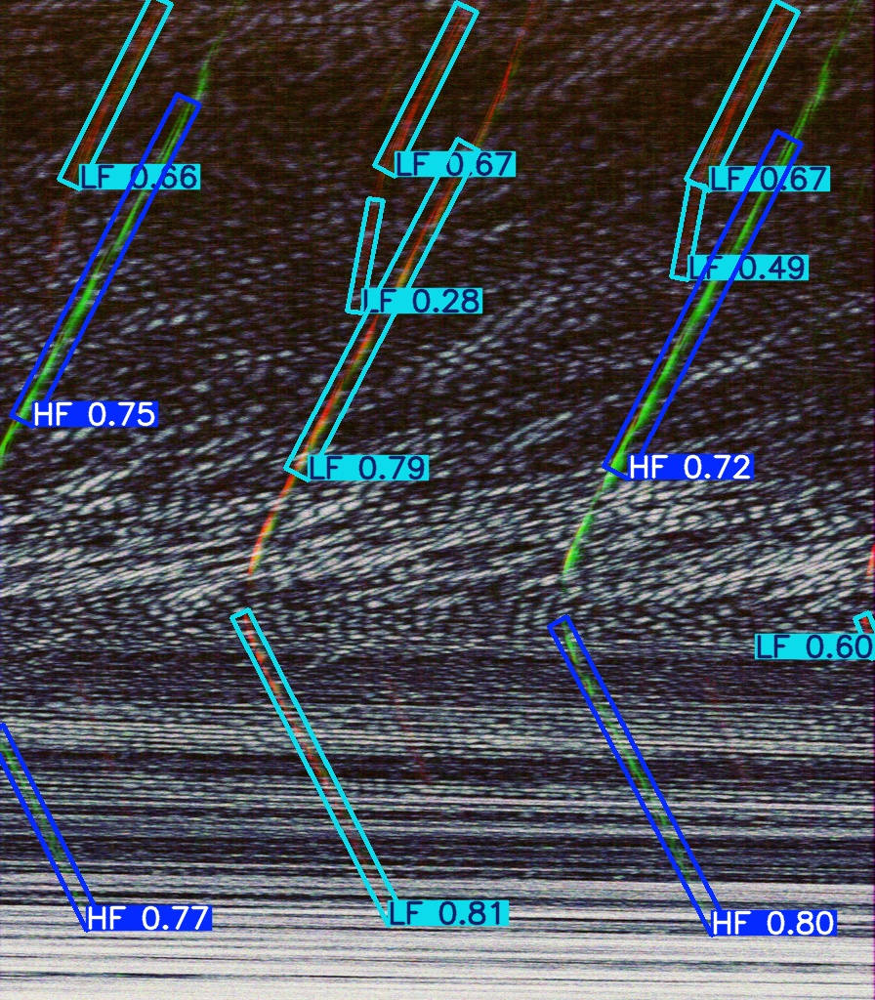

In [ ]:
sample_imgs = list((DST_FOLDER / "val" / "images").glob("*.png"))

# changing the prediction #
sample_img = sample_imgs[2]
results = model.predict(source=str(sample_img), save=True, conf=0.25)

res_plotted = results[0].plot()
cv2.imwrite("/content/pred_sample.jpg", res_plotted)
display(IPImage(filename="/content/pred_sample.jpg"))


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T235402Z.png: 1024x896 2 HFs, 9 LFs, 13.6ms
Speed: 3.1ms preprocess, 13.6ms inference, 2.6ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T235402Z.png ──


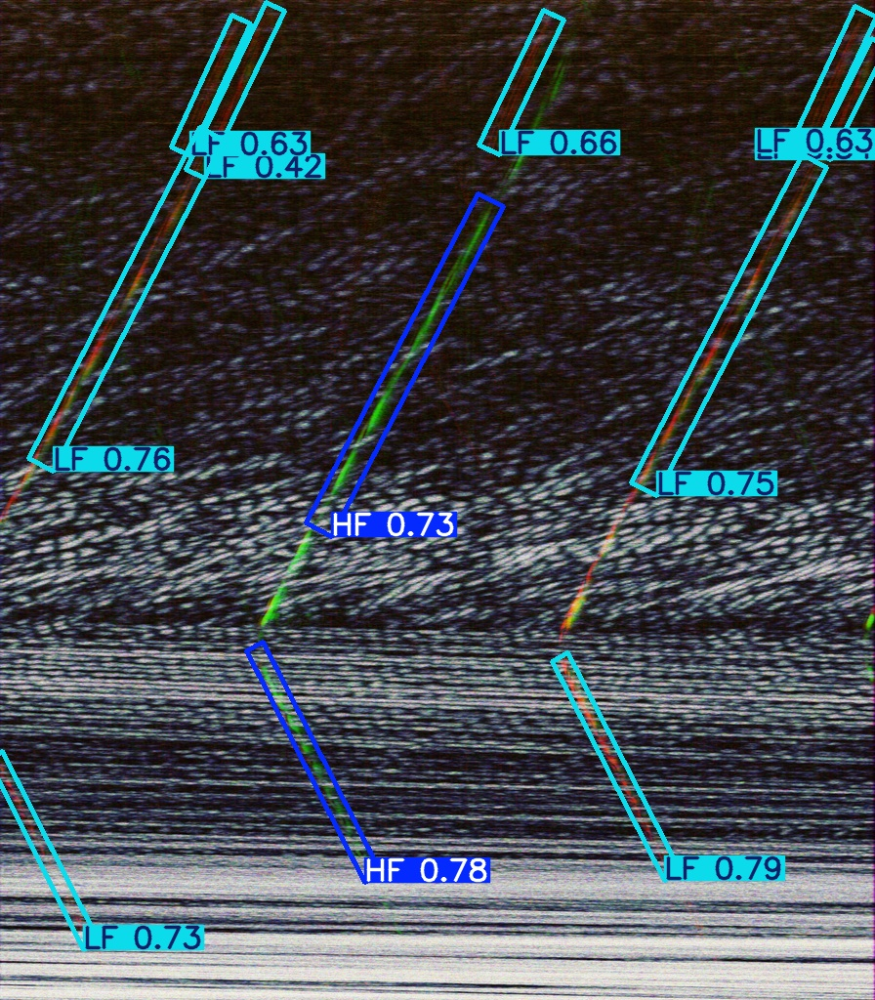


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T235502Z.png: 1024x896 4 HFs, 2 LFs, 13.6ms
Speed: 4.4ms preprocess, 13.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T235502Z.png ──


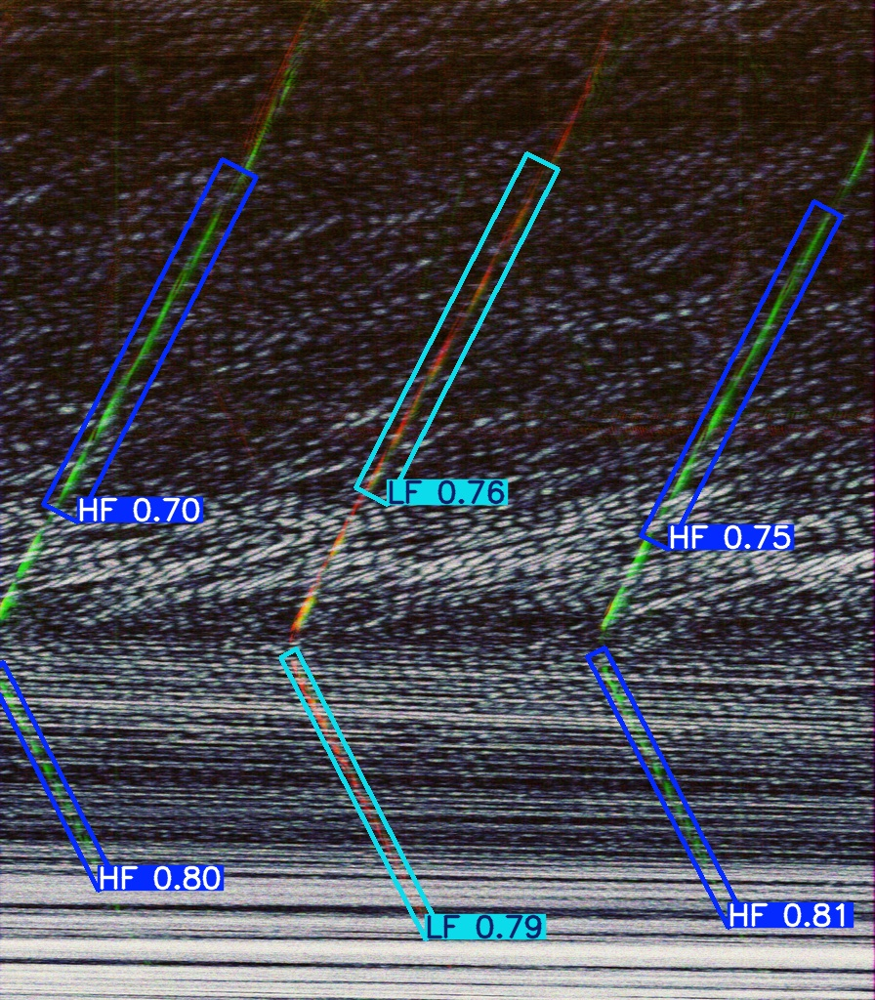


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T222002Z.png: 1024x896 4 HFs, 8 LFs, 13.6ms
Speed: 4.6ms preprocess, 13.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T222002Z.png ──


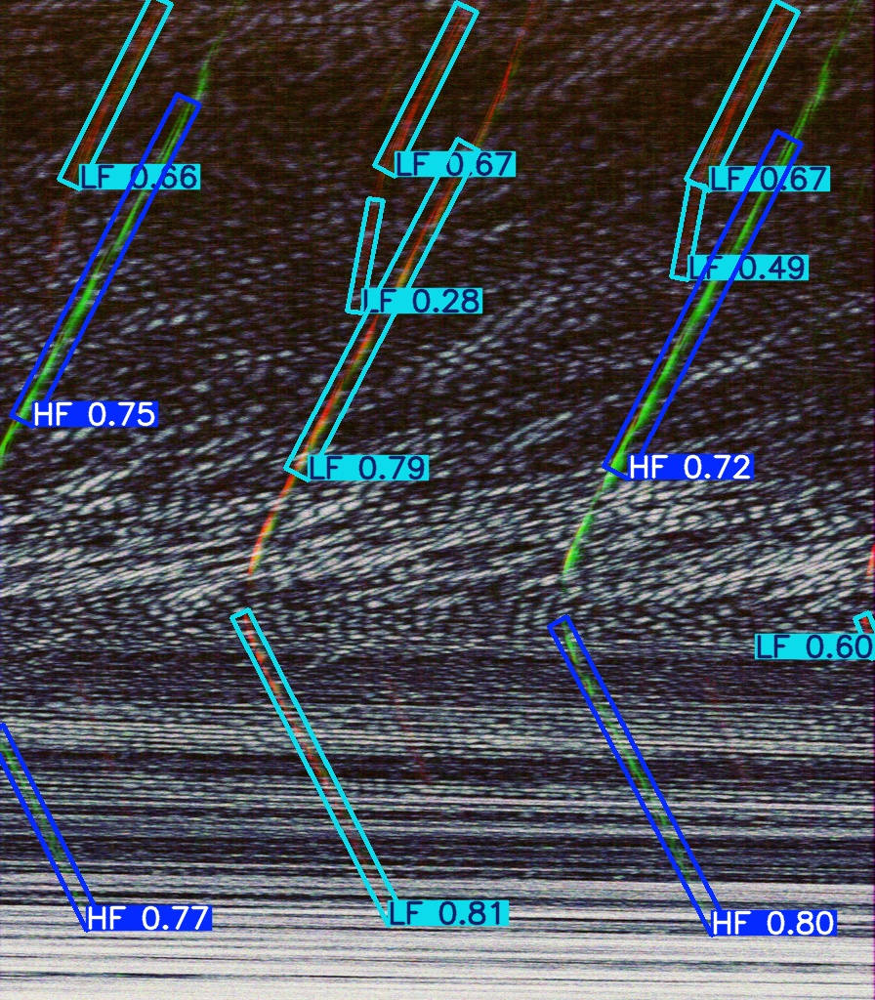


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T233402Z.png: 1024x896 4 HFs, 6 LFs, 13.6ms
Speed: 4.5ms preprocess, 13.6ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T233402Z.png ──


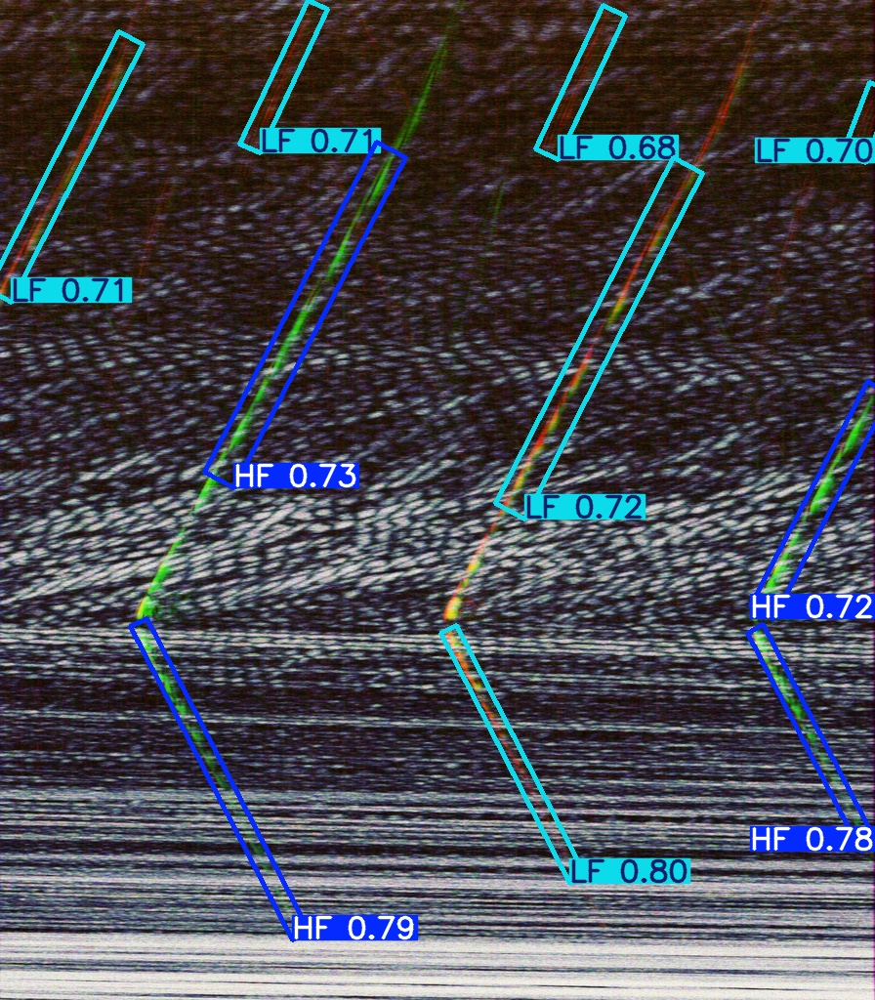


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T221202Z.png: 1024x896 6 HFs, 5 LFs, 15.6ms
Speed: 6.7ms preprocess, 15.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T221202Z.png ──


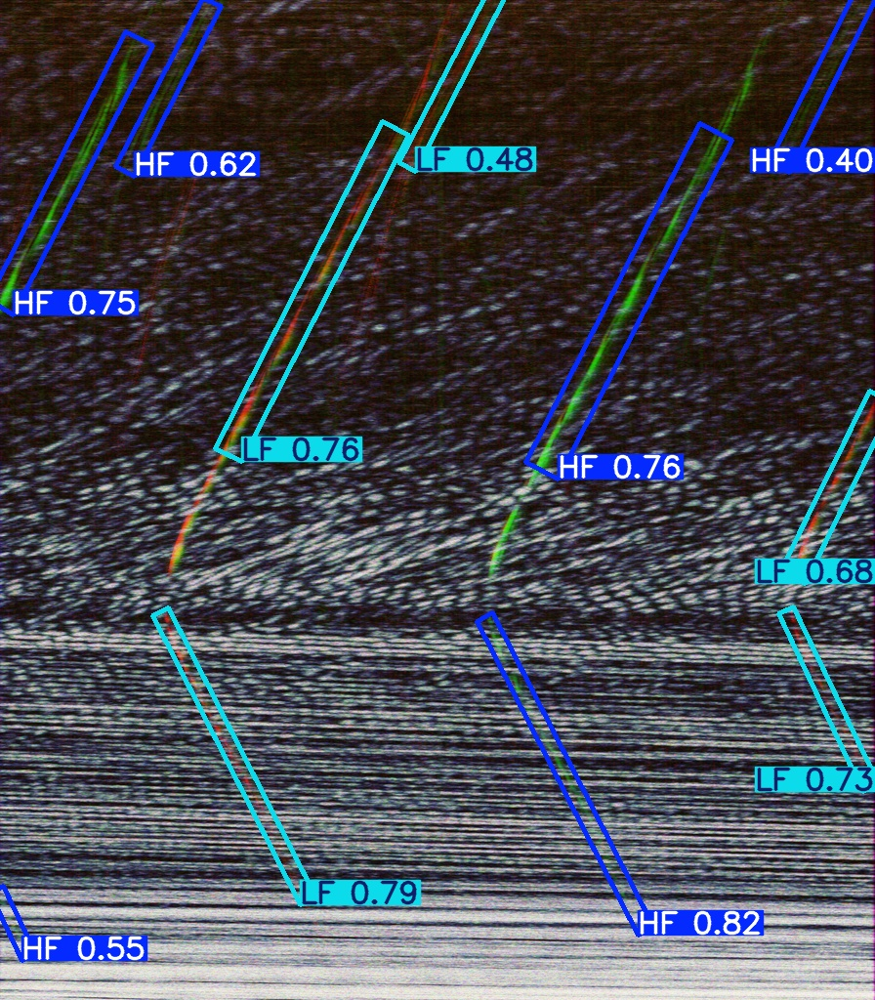


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T224002Z.png: 1024x896 1 HF, 1 LF, 13.6ms
Speed: 4.5ms preprocess, 13.6ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T224002Z.png ──


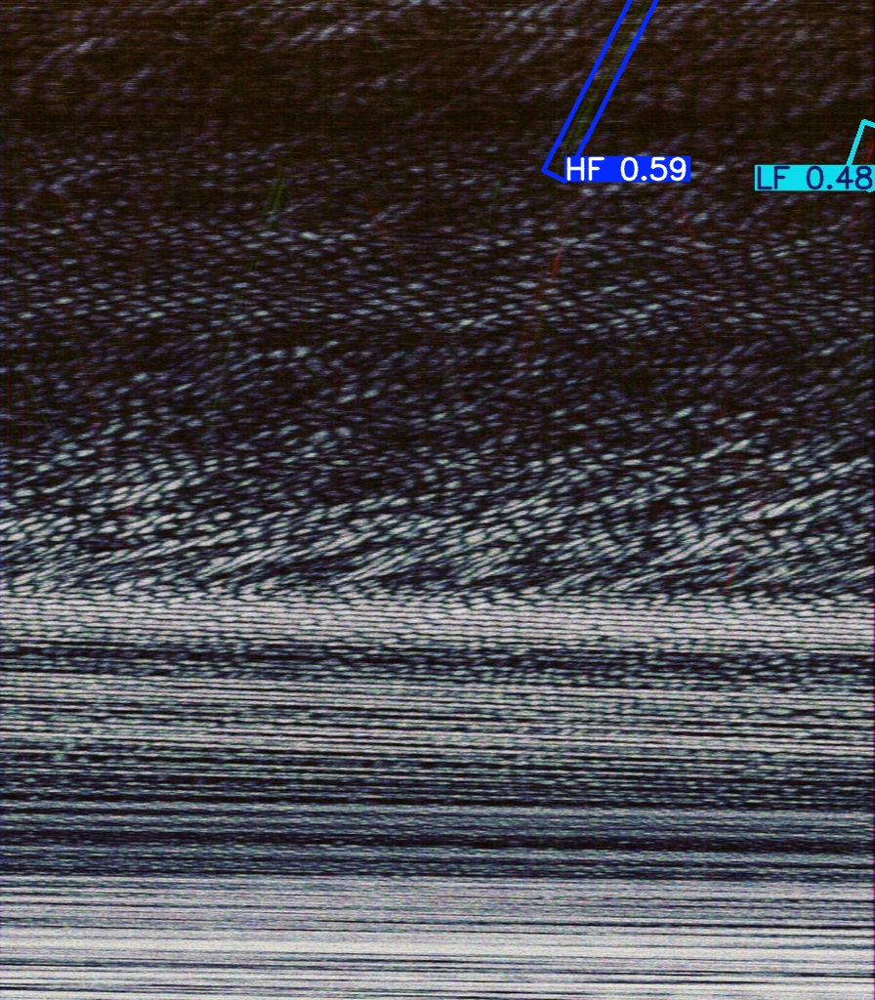


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T223802Z.png: 1024x896 3 HFs, 6 LFs, 13.6ms
Speed: 4.7ms preprocess, 13.6ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T223802Z.png ──


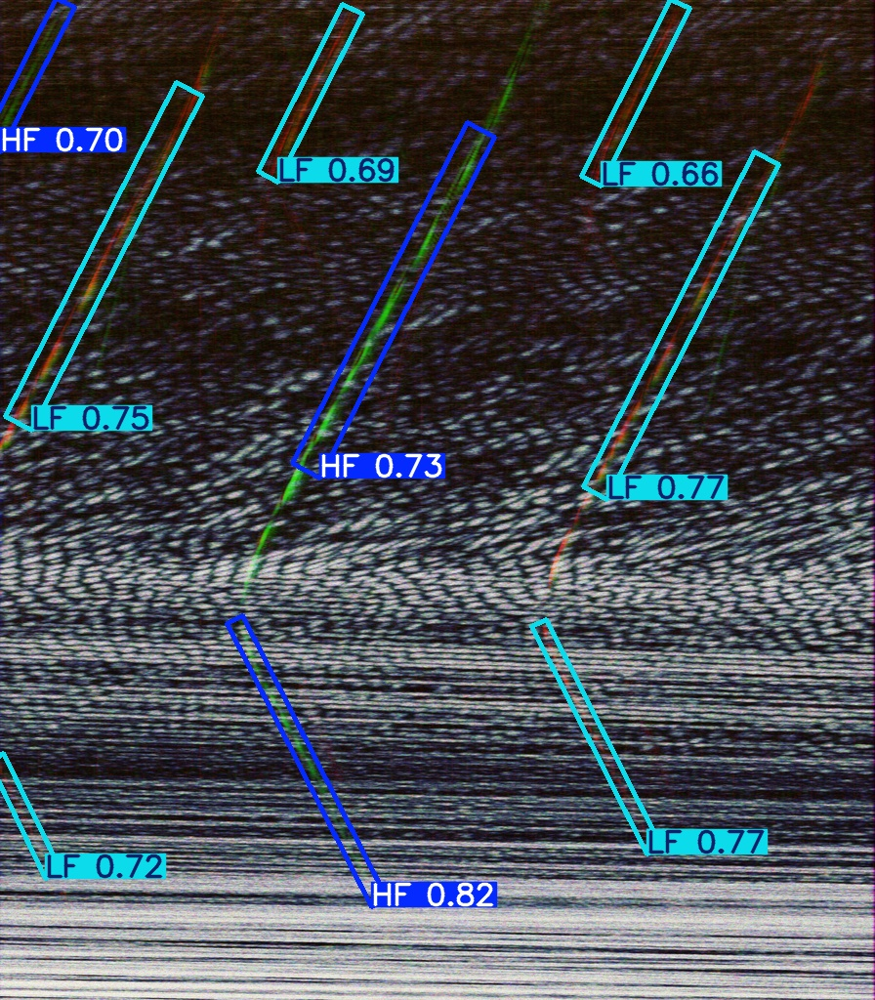


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T234802Z.png: 1024x896 4 HFs, 3 LFs, 14.2ms
Speed: 4.2ms preprocess, 14.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T234802Z.png ──


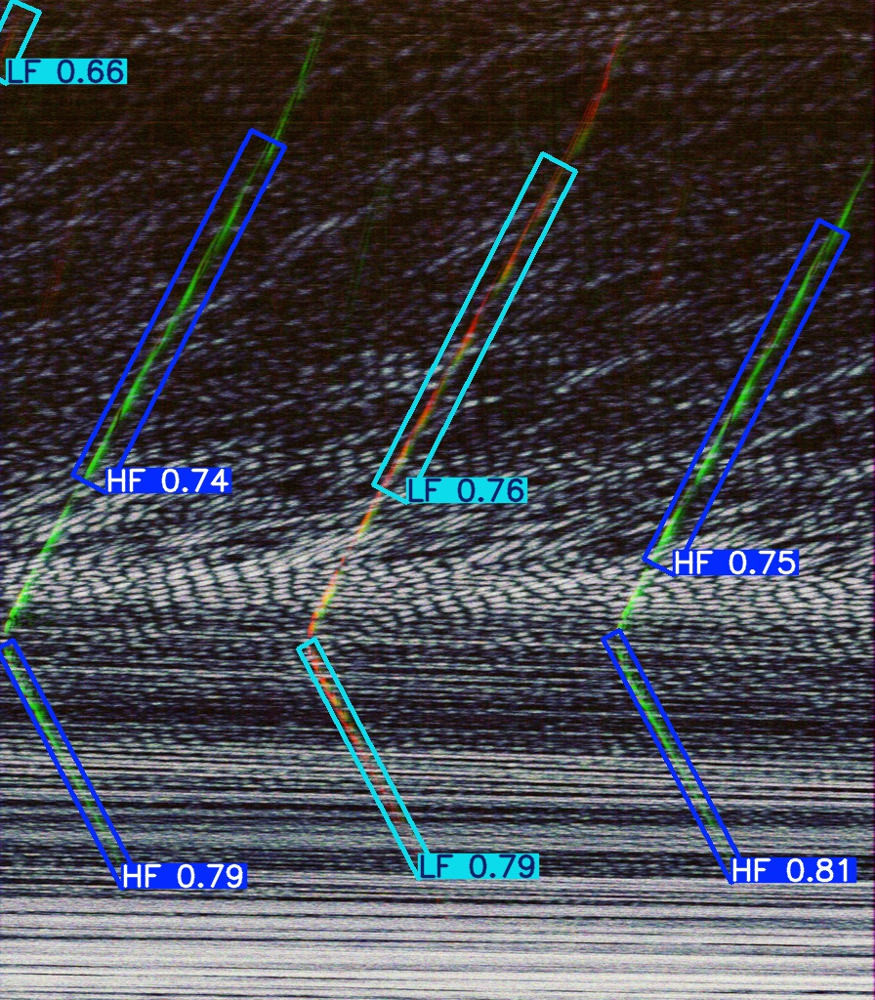


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T223702Z.png: 1024x896 5 HFs, 6 LFs, 13.6ms
Speed: 4.3ms preprocess, 13.6ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T223702Z.png ──


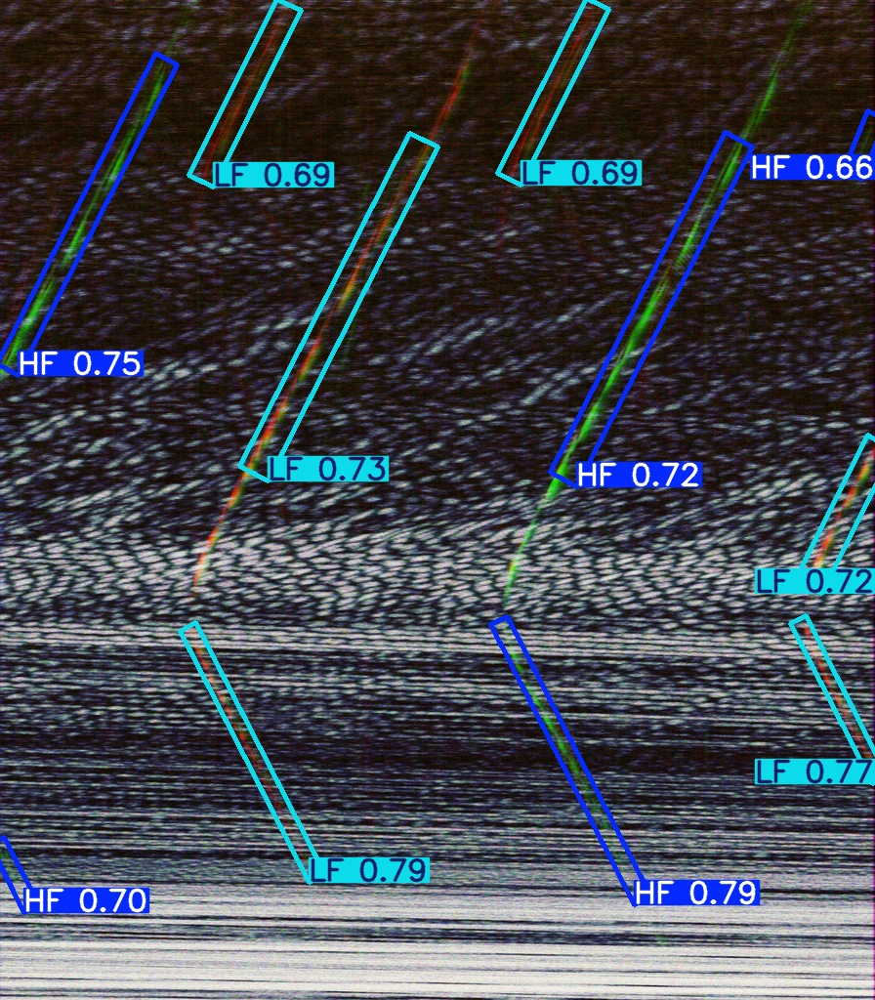


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T234002Z.png: 1024x896 3 HFs, 5 LFs, 15.2ms
Speed: 5.7ms preprocess, 15.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T234002Z.png ──


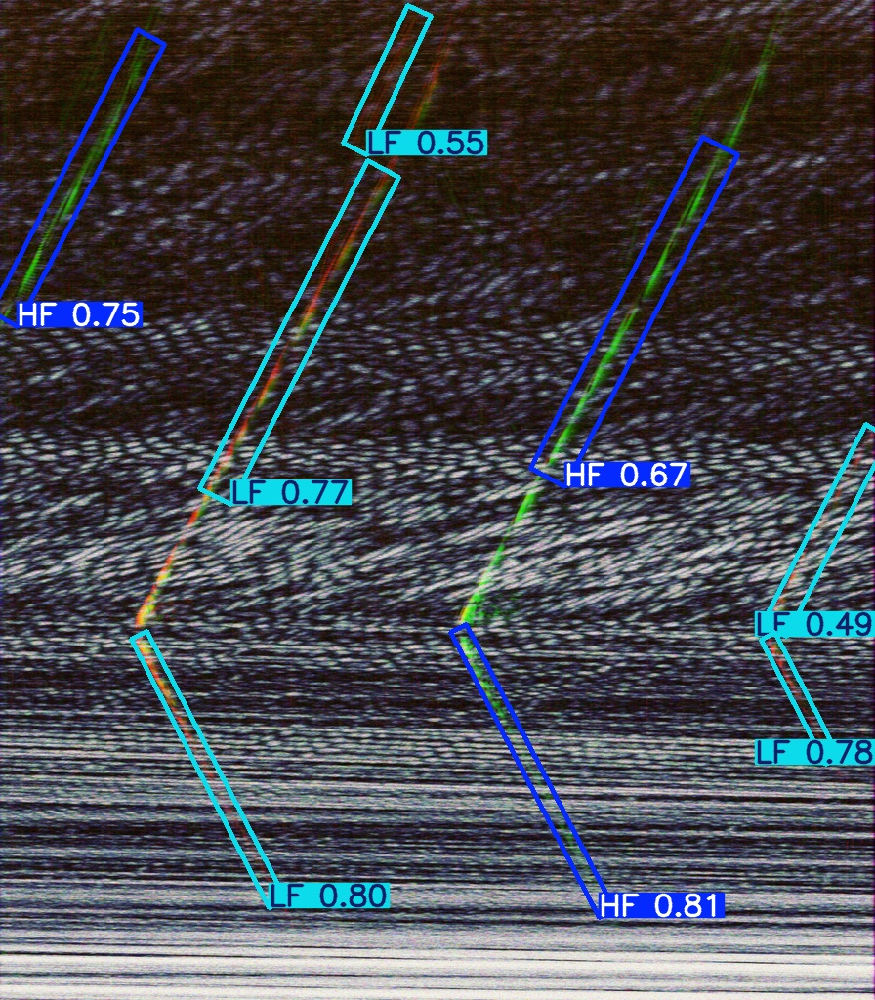


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T234602Z.png: 1024x896 4 HFs, 4 LFs, 14.0ms
Speed: 4.6ms preprocess, 14.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T234602Z.png ──


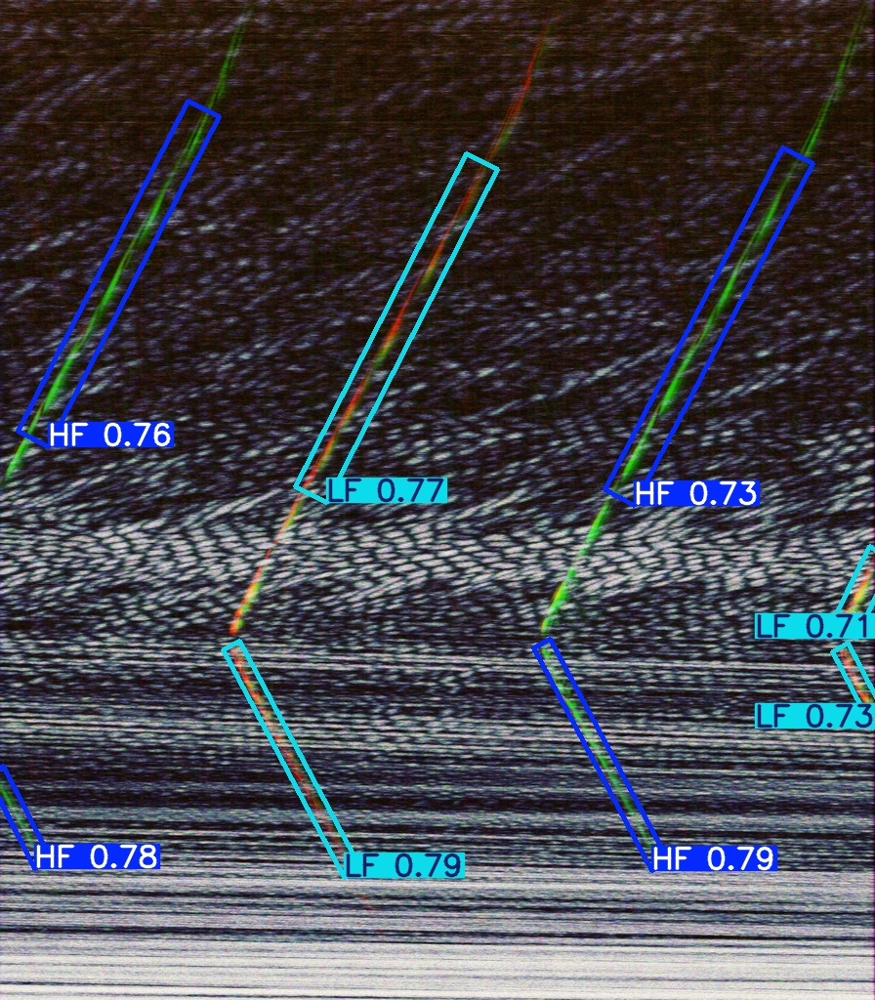


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T222302Z.png: 1024x896 4 HFs, 7 LFs, 13.6ms
Speed: 4.4ms preprocess, 13.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T222302Z.png ──


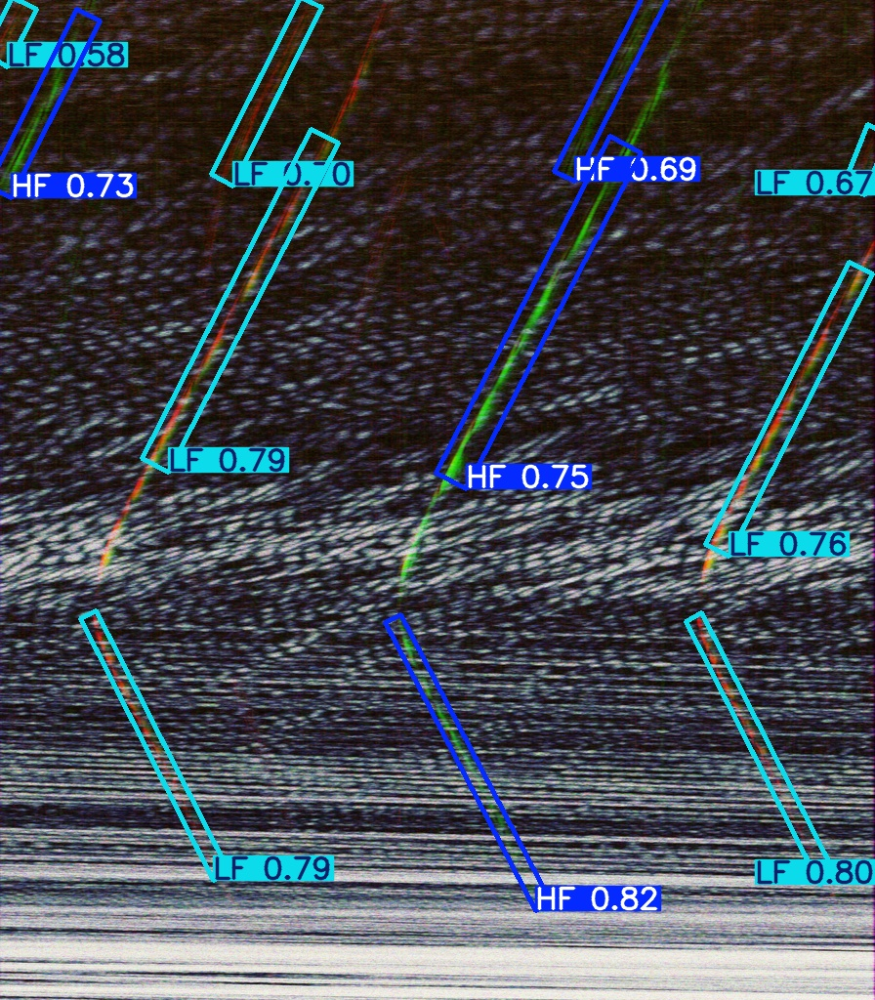


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T224402Z.png: 1024x896 5 HFs, 2 LFs, 13.8ms
Speed: 4.5ms preprocess, 13.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T224402Z.png ──


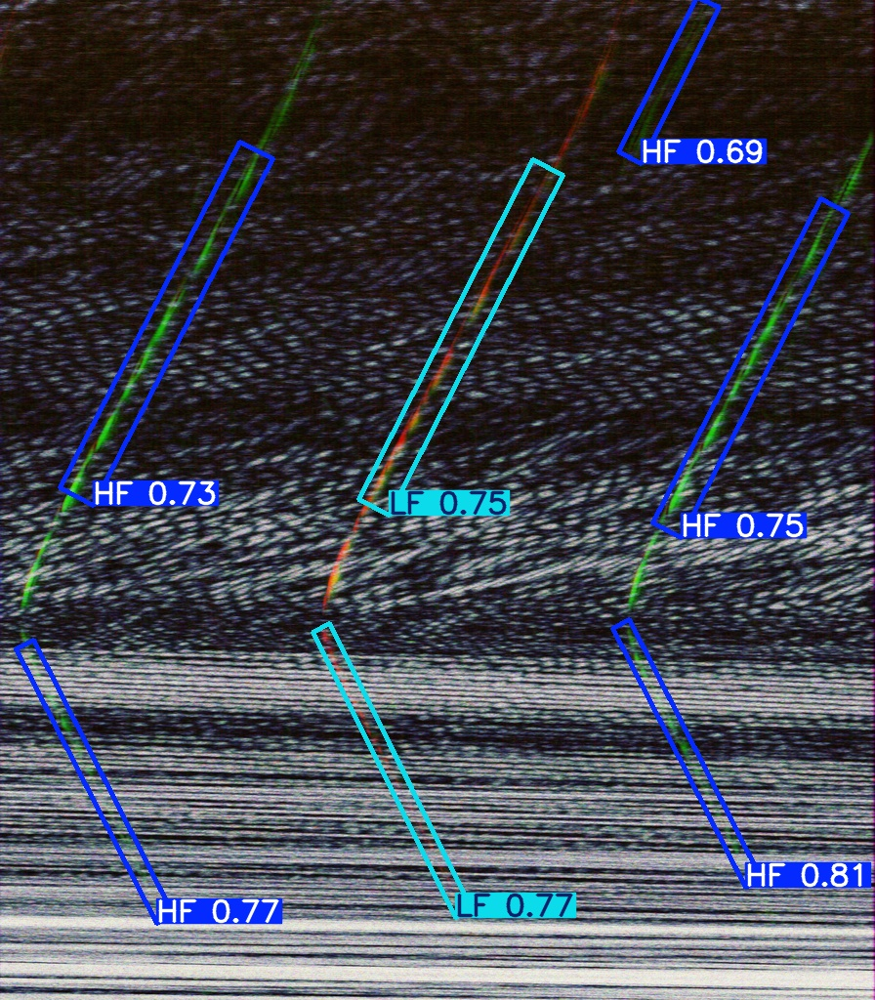


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T222602Z.png: 1024x896 4 HFs, 5 LFs, 16.1ms
Speed: 4.9ms preprocess, 16.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T222602Z.png ──


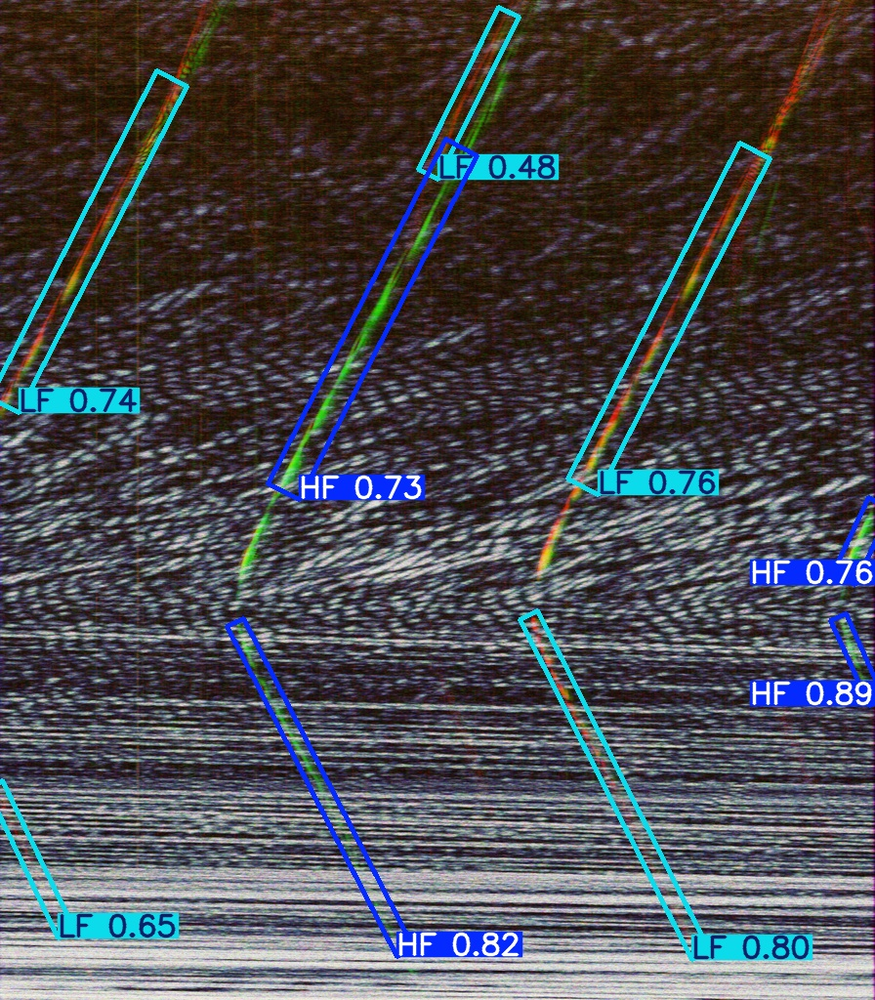


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T223602Z.png: 1024x896 5 HFs, 6 LFs, 13.6ms
Speed: 4.6ms preprocess, 13.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T223602Z.png ──


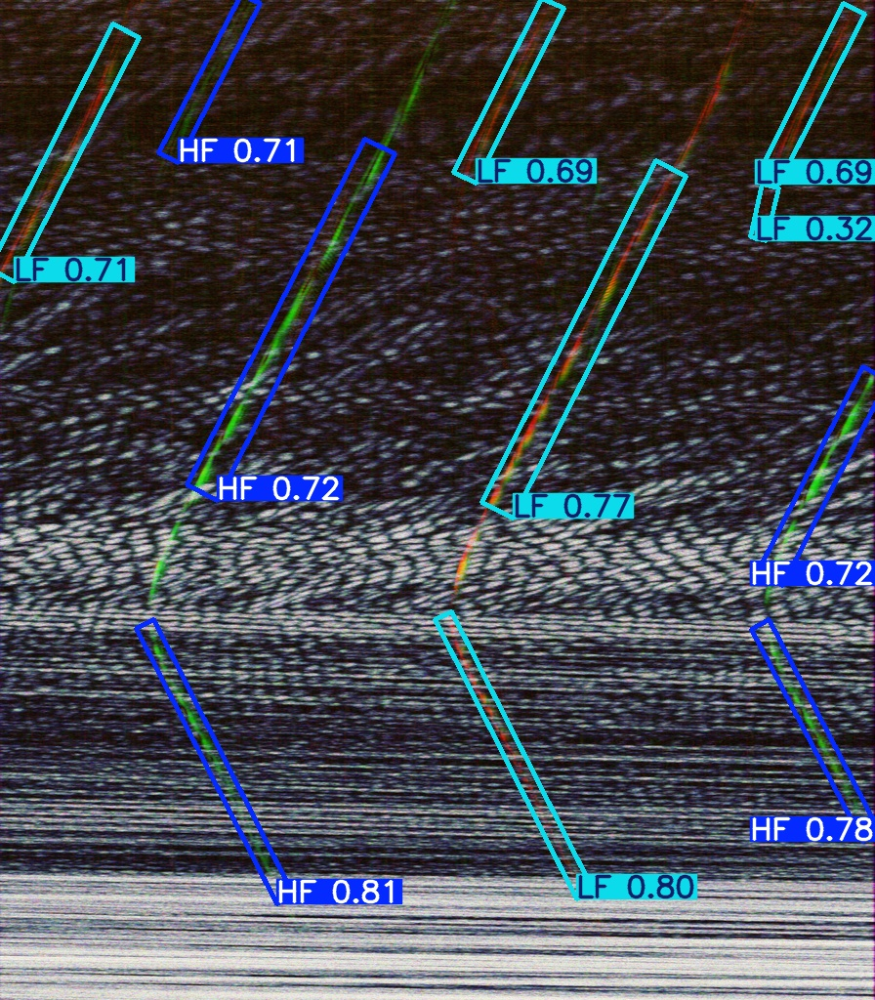


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T221302Z.png: 1024x896 1 HF, 2 LFs, 13.6ms
Speed: 4.4ms preprocess, 13.6ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T221302Z.png ──


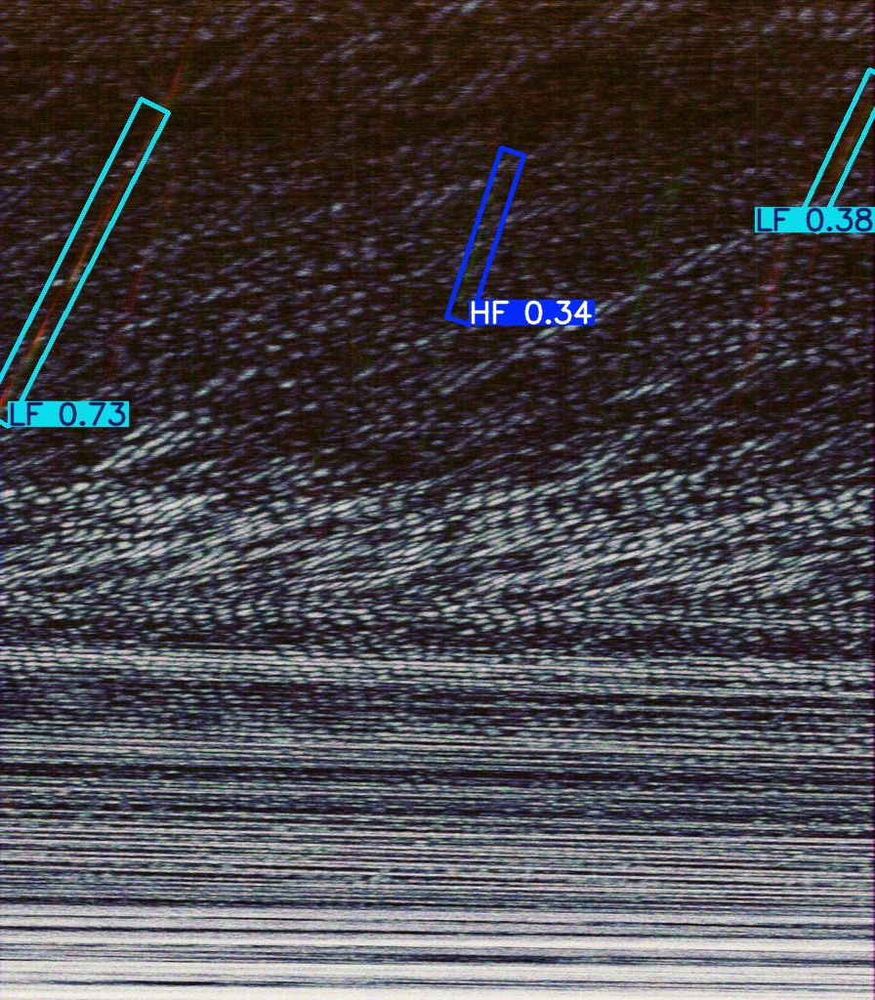


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T232802Z.png: 1024x896 4 HFs, 6 LFs, 13.6ms
Speed: 4.6ms preprocess, 13.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T232802Z.png ──


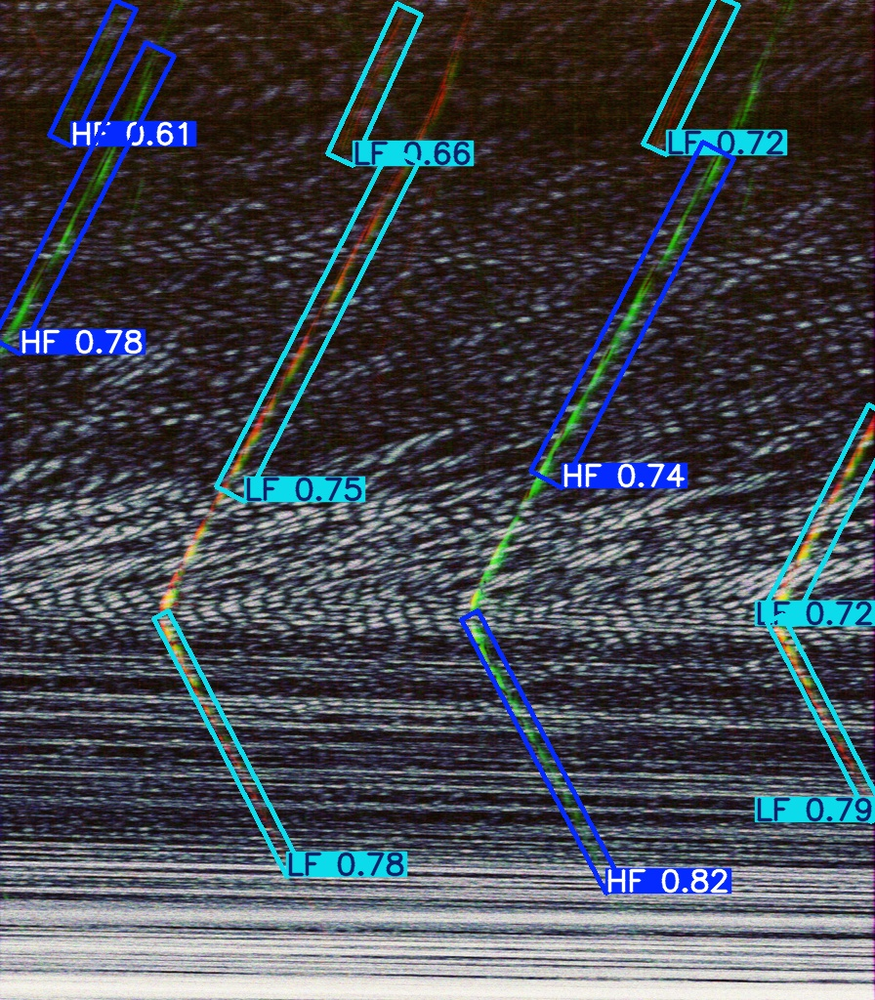


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T222202Z.png: 1024x896 5 HFs, 6 LFs, 13.6ms
Speed: 4.4ms preprocess, 13.6ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T222202Z.png ──


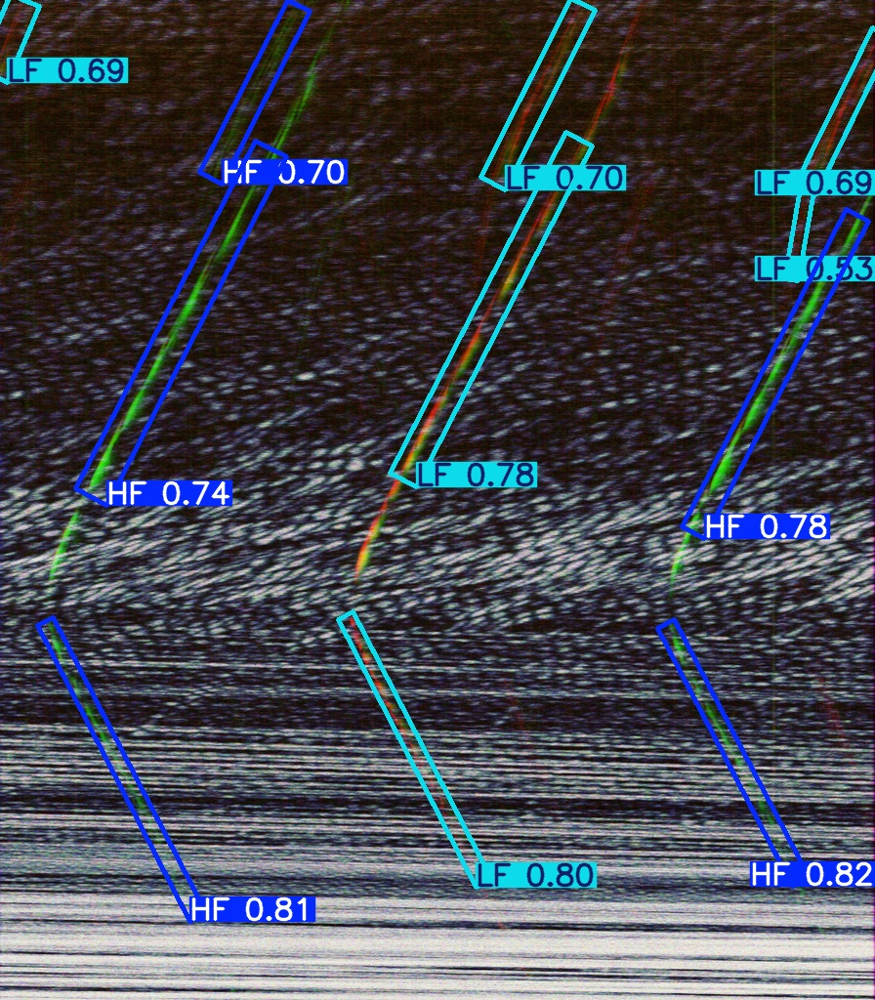


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T231302Z.png: 1024x896 4 HFs, 3 LFs, 13.6ms
Speed: 4.4ms preprocess, 13.6ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T231302Z.png ──


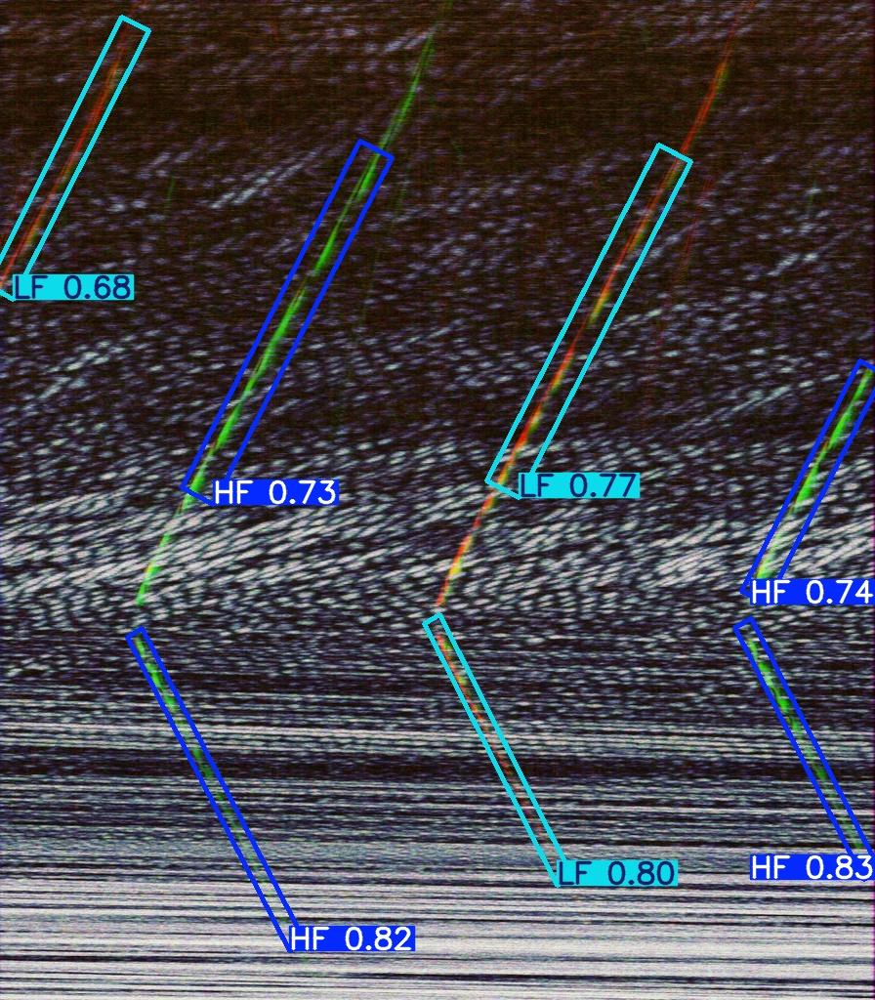


image 1/1 /content/yolo_dataset/val/images/North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T232302Z.png: 1024x896 2 HFs, 13.6ms
Speed: 4.7ms preprocess, 13.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 896)
Results saved to /content/runs/obb/predict
── North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T232302Z.png ──


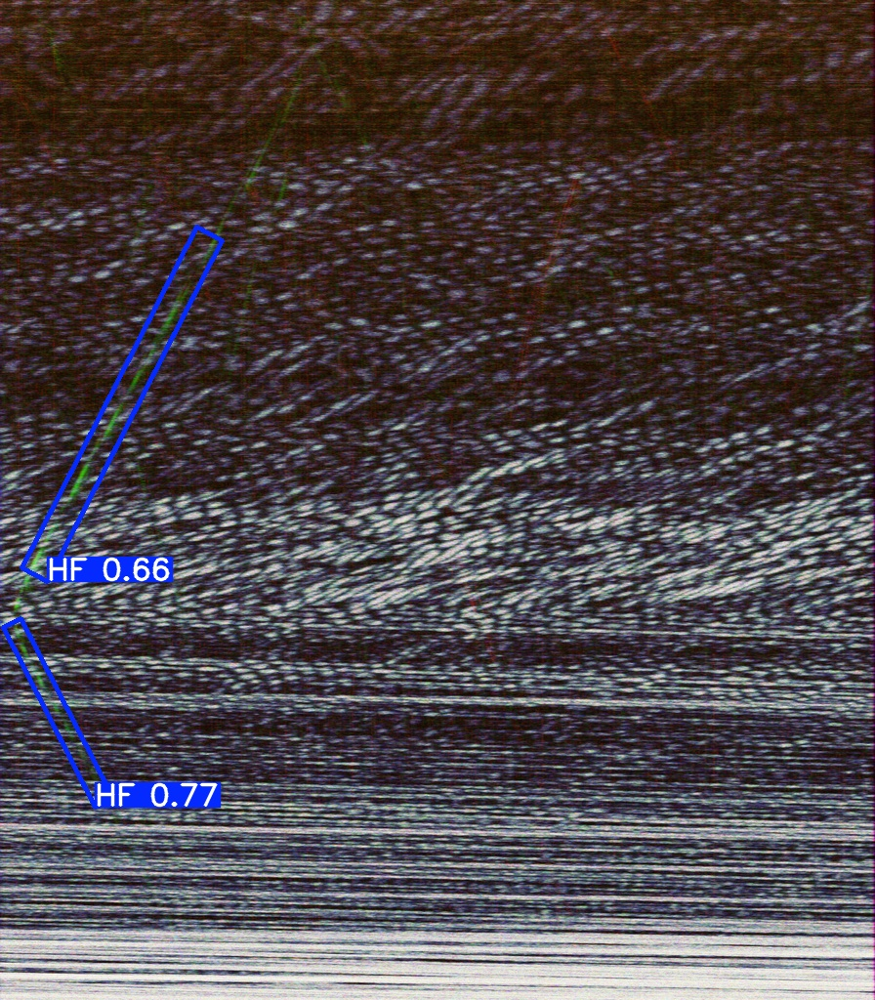

In [ ]:
for i, img_path in enumerate(sample_imgs):
    results = model.predict(source=str(img_path), save=True, conf=0.25)
    res_plotted = results[0].plot()
    cv2.imwrite(f"/content/pred_{i}.jpg", res_plotted)
    print(f"── {img_path.name} ──")
    display(IPImage(filename=f"/content/pred_{i}.jpg"))

## 11. Save best weights to Drive

In [ ]:
shutil.copy2(
    "/content/runs/obb/runs/obb/das_whale/weights/best.pt",
    "/content/drive/MyDrive/das_yolo_obb_best.pt"
)
print("✅ Best weights saved to Drive")

✅ Best weights saved to Drive
